In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os
import torch as t
from utils.config import opt
from model import FasterRCNNVGG16
from trainer import FasterRCNNTrainer
from data.util import  read_image
from utils.vis_tool import vis_bbox
from utils import array_tool as at
import numpy as np
import pickle
from tqdm.auto import tqdm
from utils.config import opt
from data.dataset import Dataset, TestDataset
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt


TRAIN_MODE = False

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
faster_rcnn = FasterRCNNVGG16()
trainer = FasterRCNNTrainer(faster_rcnn).cuda()

Setting up a new session...
Traceback (most recent call last):
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/connection.py", line 157, in _new_conn
    (self._dns_host, self.port), self.timeout, **extra_kw
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/util/connection.py", line 84, in create_connection
    raise err
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/util/connection.py", line 74, in create_connection
    sock.connect(sa)
ConnectionRefusedError: [Errno 111] Connection refused

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/connectionpool.py", line 387, in _make_request
    conn.request(method, url, **httplib_request_k

Exception in user code:
------------------------------------------------------------


# Load model trained with caffe pretrained model

In [4]:
%ls ./checkpoints/cars

baseline_results.pickle*                 kitti_features.pickle*
fasterrcnn_04151829_0.6704369972064141*  mahal_cov.pickle*
fasterrcnn_04151851_0.6877679369254311*  mahal_means.pickle*
fasterrcnn_04151914_0.7164561623943497*  mahal_result.pickle*
fasterrcnn_04151958_0.7435728692746989*  pred_bboxes_test.pickle*
fasterrcnn_04152043_0.7459420675485349*  pred_bboxes_test_softmax.pickle*
fasterrcnn_04152235_0.7462277363985176*  pred_labels_test.pickle*
gt_bboxes_test.pickle*                   pred_labels_test_softmax.pickle*
gt_difficults_test.pickle*               pred_scores_test.pickle*
gt_labels.pickle*                        pred_scores_test_softmax.pickle*
gt_labels_test.pickle*                   tsne_features.pickle*
inv_mahal_cov.pickle*


In [5]:
save_dir = './checkpoints/cars'

trainer.load(os.path.join(save_dir, 'fasterrcnn_04152235_0.7462277363985176'))

FasterRCNNTrainer(
  (faster_rcnn): FasterRCNNVGG16(
    (extractor): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): Re

### Test how many Rickshaws get detected as objects out of total in test set

In [6]:
import os

images_dir = '/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/JPEGImages/frontNear'
sub_dirs = [os.path.join(images_dir, s) for s in os.listdir(images_dir)]

img_paths = []
for s in sub_dirs:
    img_files = os.listdir(s)
    img_paths += [os.path.join(s, f) for f in img_files]

print("Total of %d frontnear images in IDD" % len(img_paths))

Total of 5362 frontnear images in IDD


In [6]:
from idd_utils import get_annotations
from model.utils.bbox_tools import bbox_iou

SCALE = 1.

class_iou_sum = {}
class_iou_count = {}

for path in img_paths:
    # Get path to annotations
    annotation_path = path.replace("JPEGImages", "Annotations").replace('.jpg', '.xml')
    
    if not os.path.exists(annotation_path):
        print(annotation_path, "does not exist")
        continue
    
    gt_bboxes, gt_labels = get_annotations(annotation_path)
    
    if len(gt_bboxes) == 0:
        continue
    
    # Load image
    img = np.array([read_image(path)])
    
    # Get the top 300 RPN boxes for class "object"
    res = trainer.faster_rcnn.get_rpn_output(at.totensor(img), scales=[SCALE])
    rpn_locs, rpn_scores, rois, roi_indices, anchor = res

    rpn_locs = at.tonumpy(rpn_locs)
    rpn_scores = at.tonumpy(rpn_scores)
    
    obj_scores = rpn_scores[0,:,1]
    obj_sorted = np.argsort(obj_scores)

    max_300_obj = obj_sorted[-300:]
    proposal_bboxes = at.tonumpy(anchor)[max_300_obj]
#     vis_bbox(at.tonumpy(img[0]), proposal_bboxes)
    
#     vis_bbox(at.tonumpy(img[0]), gt_bboxes)
    # ymin xmin ymax xmax
    
    ious = bbox_iou(gt_bboxes, proposal_bboxes)
    ious = ious.max(axis=1)
    
    for name, iou in zip(gt_labels, ious):
        cur_sum = class_iou_sum.get(name, 0)
        cur_count = class_iou_count.get(name, 0)
        class_iou_sum[name] = cur_sum + iou
        class_iou_count[name] = cur_count + 1
    
    # Determine what percentage of GT boxes of each kind are captures by RPN boxes
#     break

/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-24-27_frontNear/000228_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-24-27_frontNear/0003660.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-24-27_frontNear/0000120.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-24-27_frontNear/0000360.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-24-27_frontNear/0000420.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-24-27_frontNear/0000480.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-24-27_frontNear/000048_r.xm

/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-54-27_frontNear/000012_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-54-27_frontNear/0000240.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-54-27_frontNear/000024_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-54-27_frontNear/0000300.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-54-27_frontNear/000030_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-54-27_frontNear/0000360.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-16_15-54-27_frontNear/0000420.x

/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-26_13-40-01_frontNear/0001500.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-26_13-40-01_frontNear/000150_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-26_13-40-01_frontNear/0001560.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-26_13-40-01_frontNear/0001620.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-26_13-40-01_frontNear/000162_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-26_13-40-01_frontNear/0001680.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-04-26_13-40-01_frontNear/000168_r.x

/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-05-14_13-49-25_frontNear/000480_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-06-06_16-10-31_frontNear/000046_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-06-06_16-10-31_frontNear/0000600.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-06-06_16-10-31_frontNear/000060_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-06-06_16-10-31_frontNear/0000690.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-06-06_16-10-31_frontNear/000069_r.xml does not exist
/media/tadenoud/DATADisk/datasets/idd_detection/IDD_Detection/Annotations/frontNear/BLR-2018-06-06_16-10-31_frontNear/000096_r

In [7]:
class_iou_count

{'autorickshaw': 987,
 'person': 4736,
 'motorcycle': 5416,
 'truck': 2237,
 'car': 5288,
 'rider': 5316,
 'vehicle fallback': 853,
 'bus': 1727,
 'bicycle': 301,
 'traffic sign': 938,
 'animal': 817,
 'trailer': 4,
 'traffic light': 48,
 'caravan': 8,
 'train': 1}

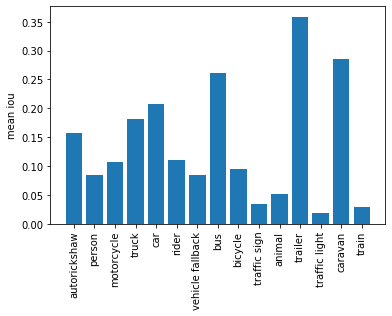

In [8]:
average_ious = class_iou_sum.copy()
for k in average_ious.keys():
    average_ious[k] /= class_iou_count[k]
    
plt.bar(average_ious.keys(), average_ious.values())
plt.ylabel("mean iou")
_ = plt.xticks(rotation=90)

In the above chart, higher mean IOU means that kind of object is proposed by the RPN with better accuracy on average

### Get non NMS suppression boxes, class predictions, and scores

/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:638: UserWarning: Legacy autograd function with non-static forward method is deprecated and will be removed in 1.3. Please use new-style autograd function with static forward method. (Example: https://pytorch.org/docs/stable/autograd.html#torch.autograd.Function)
/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:638: UserWarning: Legacy autograd function with non-static forward method is deprecated and will be removed in 1.3. Please use new-style autograd function with static forward method. (Example: https://pytorch.org/docs/stable/autograd.html#torch.autograd.Function)
/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:638: UserWarning: Legacy autograd function with non-static forward method is deprecated and will be removed in 1.3. Please use new-style autograd function with static forward method. (Example: https://pytorch

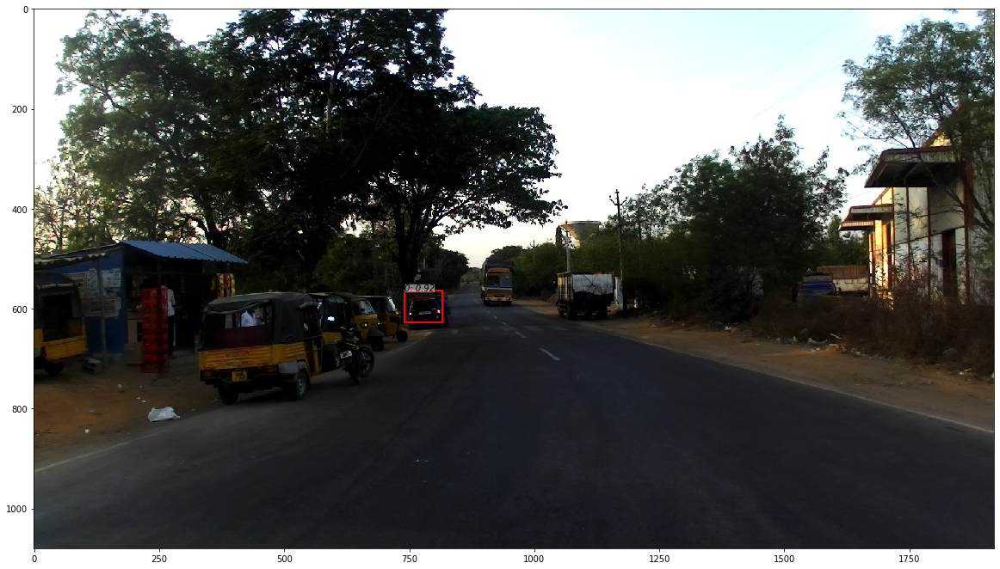

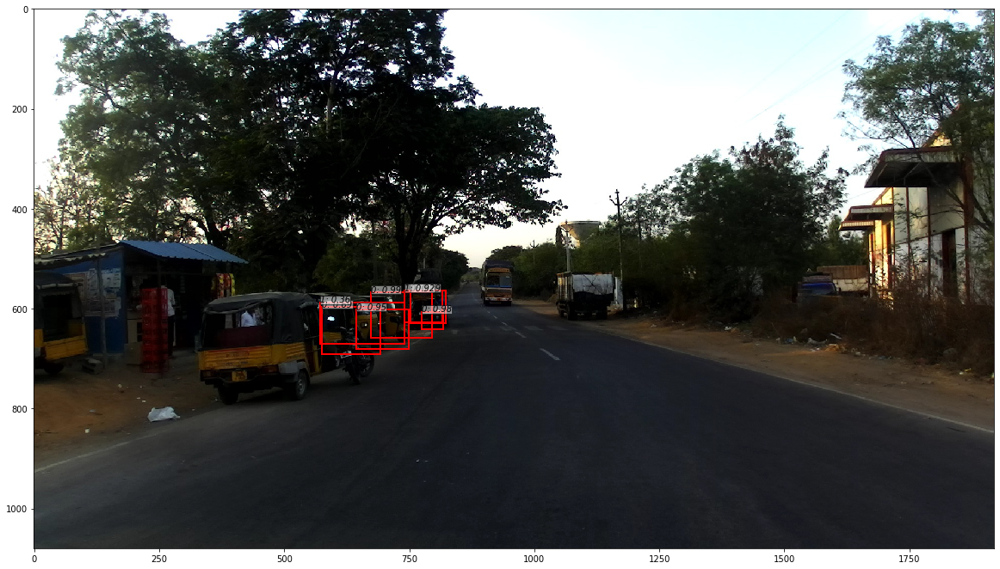

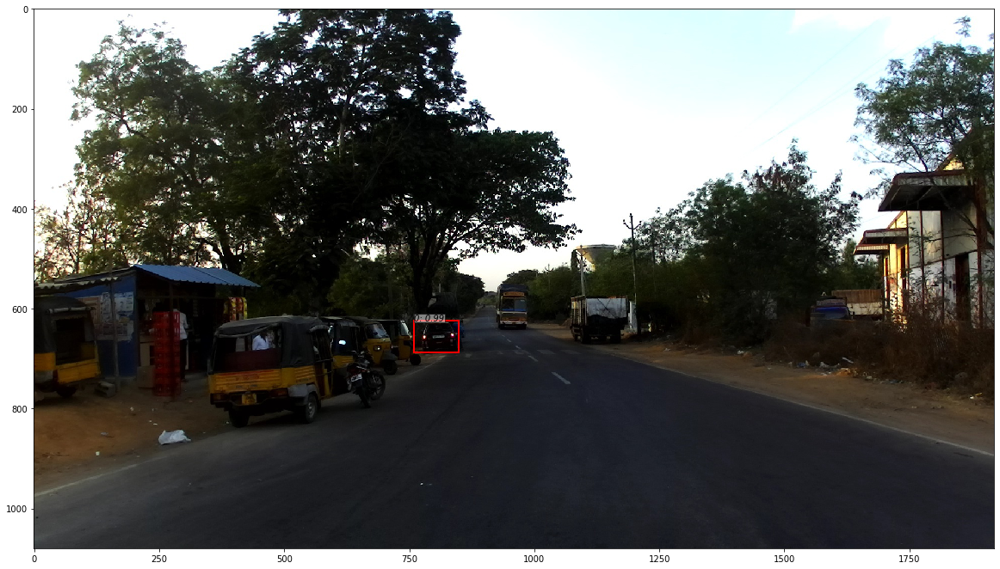

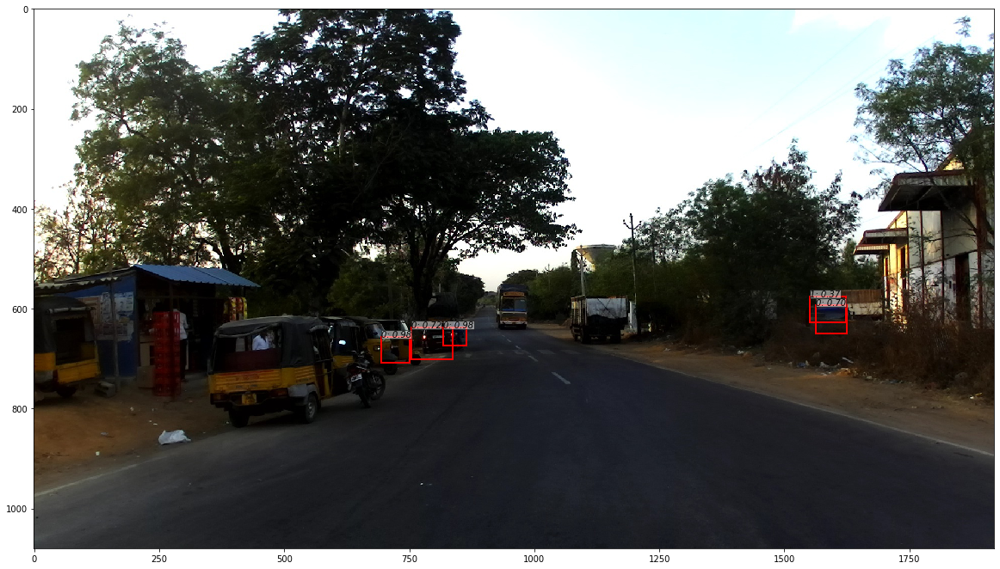

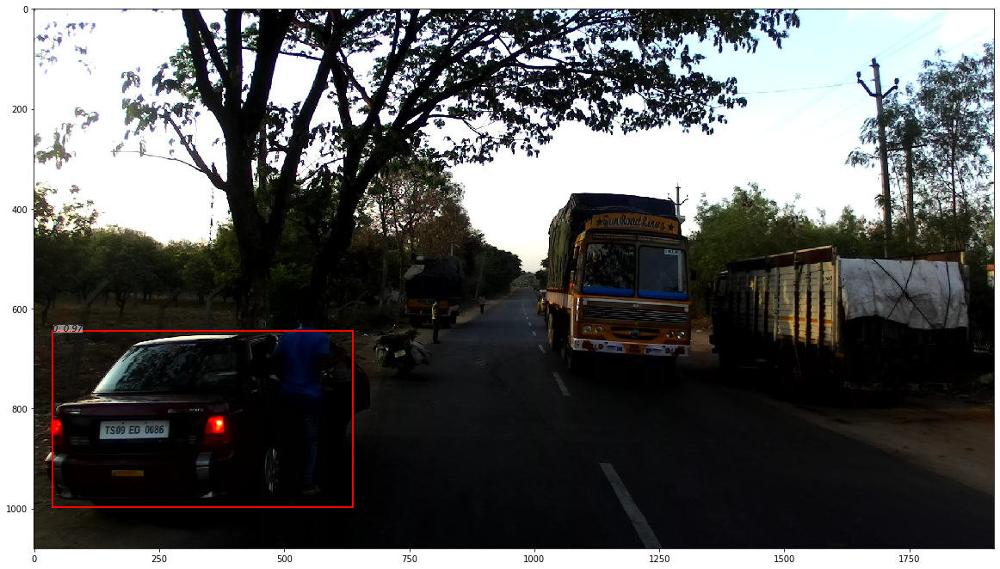

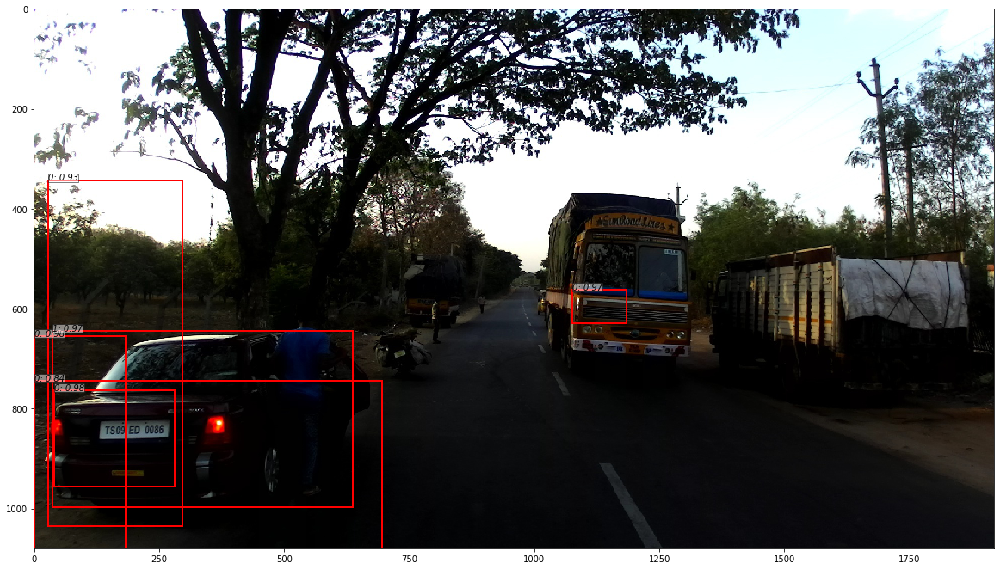

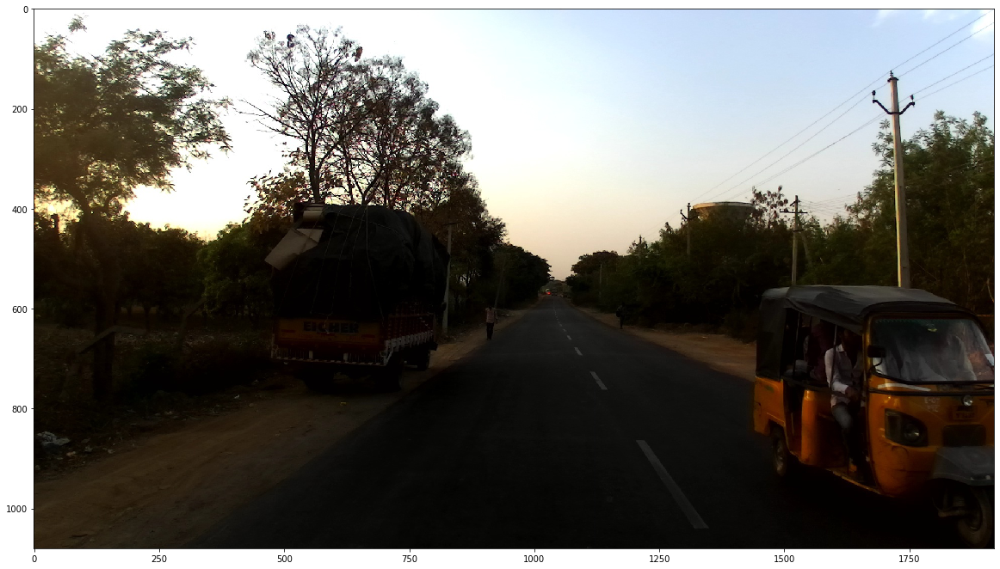

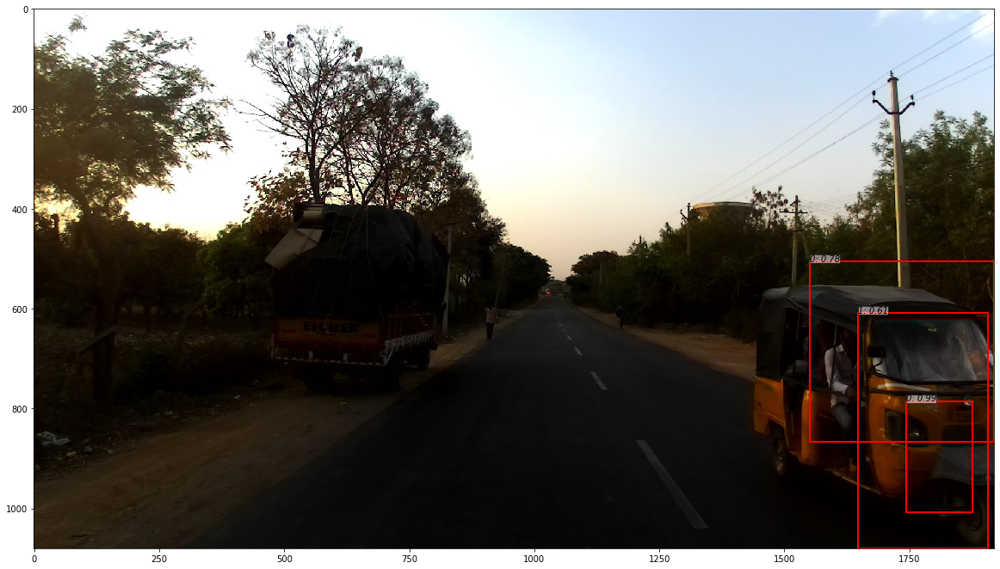

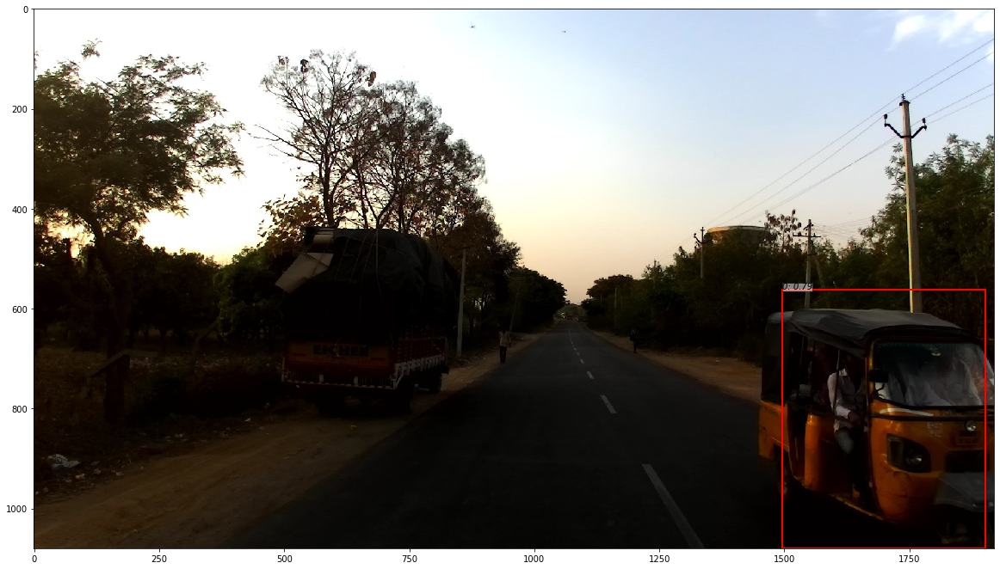

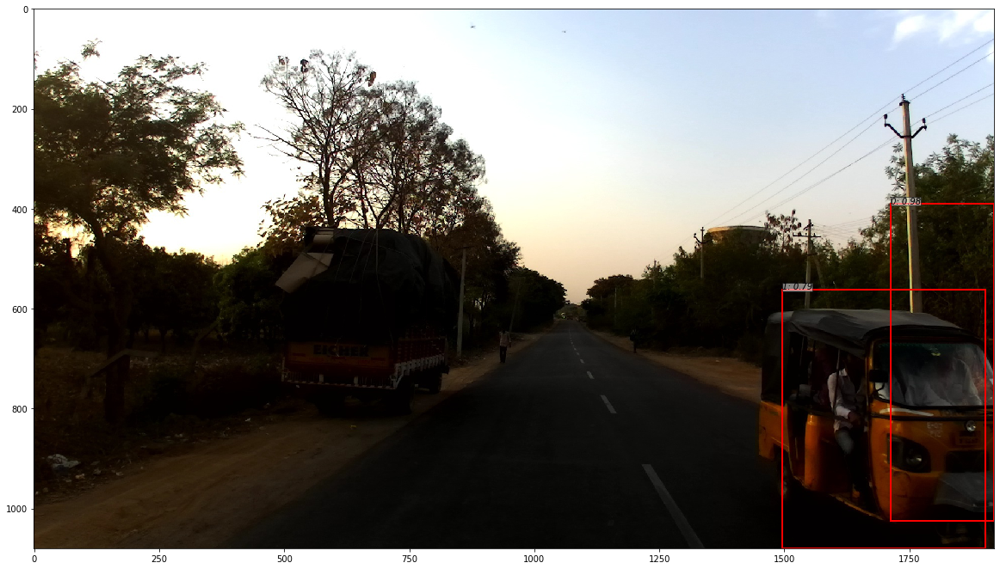

In [8]:
for path in img_paths[:5]:
    # Get path to annotations
    annotation_path = path.replace("JPEGImages", "Annotations").replace('.jpg', '.xml')
    
    if not os.path.exists(annotation_path):
        print(annotation_path, "does not exist")
        continue
    
#     gt_bboxes, gt_labels = get_annotations(annotation_path)
    
#     if len(gt_bboxes) == 0:
#         continue
    
    # Load image
    img = np.array([read_image(path)])

    # Get the predicted objects in the image
    _bboxes, _labels, _scores = trainer.faster_rcnn.predict(img,visualize=True)
    
    vis_bbox(at.tonumpy(img[0]),
             at.tonumpy(_bboxes[0]),
             at.tonumpy(_labels[0].reshape(-1)),
             at.tonumpy(_scores[0].reshape(-1)))
    
    _bboxes, _labels, _scores = trainer.faster_rcnn.predict_with_bg(img,visualize=True)
    mask = _scores[0] < 0.99

    vis_bbox(at.tonumpy(img[0]),
             at.tonumpy(_bboxes[0][mask]),
             at.tonumpy(_labels[0][mask].reshape(-1)),
             at.tonumpy(_scores[0][mask].reshape(-1))) 
    
#     ious = bbox_iou(gt_bboxes, proposal_bboxes)
#     ious = ious.max(axis=1)
    
#     for name, iou in zip(gt_labels, ious):
#         cur_sum = class_iou_sum.get(name, 0)
#         cur_count = class_iou_count.get(name, 0)
#         class_iou_sum[name] = cur_sum + iou
#         class_iou_count[name] = cur_count + 1



### Calculate stats about how many of the rickshaw boxes have lower confidence than cars

### Repeat with Mahalanobis method

# Train mahalanobis features with entire training dataset

In [9]:
opt.voc_data_dir = "/media/tadenoud/DATADisk/datasets/kitti_2d/VOC2012/"
dataset = Dataset(opt)
dataloader = DataLoader(dataset,
                        batch_size=1,
                        shuffle=False,
                        pin_memory=True,
                        num_workers=opt.num_workers)

if TRAIN_MODE:
    trainer.faster_rcnn.train_ood(dataloader)
    trainer.faster_rcnn.save_mahalanobis_features(save_dir=save_dir)
else:
    trainer.faster_rcnn.load_mahalanobis_features(save_dir=save_dir)

In [10]:
if TRAIN_MODE:
    with open(os.path.join(save_dir, 'gt_labels.pickle'), 'wb') as f:
        pickle.dump(trainer.faster_rcnn.gt_labels, f)
# else:
    
with open(os.path.join(save_dir, 'gt_labels.pickle'), 'rb') as f:
    gt_labels = pickle.load(f)

In [11]:
VOC_BBOX_LABEL_NAMES = (
    'car',
    'van',
    'truck',
    'tram',
    'person',
    'person_sitting',
    'cyclist',
    'misc'
    # 'dontcare
)

for j in range(8):
    print(VOC_BBOX_LABEL_NAMES[j], "count:", sum([i == j for i in gt_labels]))

car count: 2602
van count: 0
truck count: 0
tram count: 0
person count: 0
person_sitting count: 0
cyclist count: 0
misc count: 0


# Predict class using features

In [16]:
# Evaluate baseline softmax method
from train import eval, eval_mahal

print('load data') 
test_dataset = TestDataset(opt)
test_dataloader = DataLoader(test_dataset,
                             batch_size=1,
                             shuffle=False,
                             pin_memory=True,
                             num_workers=opt.num_workers)

if TRAIN_MODE:
    baseline_result = eval(test_dataloader, trainer.faster_rcnn, test_num=opt.test_num)
    with open(os.path.join(save_dir, "baseline_results.pickle"), 'wb') as f:
        pickle.dump(baseline_result, f)
    
with open(os.path.join(save_dir, "baseline_results.pickle"), 'rb') as f:
    baseline_result = pickle.load(f)
    
print(baseline_result)

load data
{'map': 0.7462637677770373, 'ap': array([0.74626377])}


In [17]:
# Evaluate mahalanobis distance method

if TRAIN_MODE:
    mahal_result = eval_mahal(test_dataloader, trainer.faster_rcnn, test_num=opt.test_num)
    with open(os.path.join(save_dir, "mahal_result.pickle"), "wb") as f:
        pickle.dump(mahal_result, f)
else:    
    with open(os.path.join(save_dir, "mahal_result.pickle"), "rb") as f:
        mahal_result = pickle.load(f)
    
print(mahal_result)

{'ap': array([0.70620091]), 'map': 0.706200905443196}


/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:638: UserWarning: Legacy autograd function with non-static forward method is deprecated and will be removed in 1.3. Please use new-style autograd function with static forward method. (Example: https://pytorch.org/docs/stable/autograd.html#torch.autograd.Function)


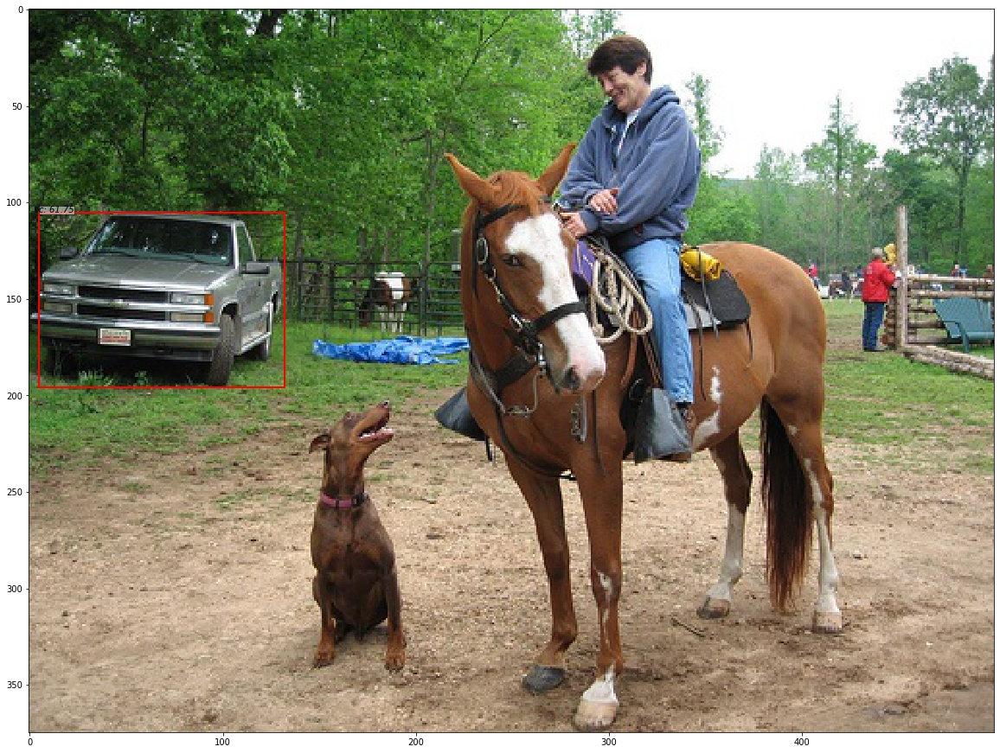

In [18]:
_bboxes, _labels, _scores = trainer.faster_rcnn.predict_mahalanobis(img,visualize=True)

vis_bbox(at.tonumpy(img[0]),
         at.tonumpy(_bboxes[0]),
         at.tonumpy(_labels[0].reshape(-1)),
         at.tonumpy(_scores[0].reshape(-1)))

/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:638: UserWarning: Legacy autograd function with non-static forward method is deprecated and will be removed in 1.3. Please use new-style autograd function with static forward method. (Example: https://pytorch.org/docs/stable/autograd.html#torch.autograd.Function)
/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:638: UserWarning: Legacy autograd function with non-static forward method is deprecated and will be removed in 1.3. Please use new-style autograd function with static forward method. (Example: https://pytorch.org/docs/stable/autograd.html#torch.autograd.Function)
/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:664: UserWarning: Legacy autograd function object was called twice.  You will probably get incorrect gradients from this computation, as the saved tensors from the second invocation will clobber the saved ten

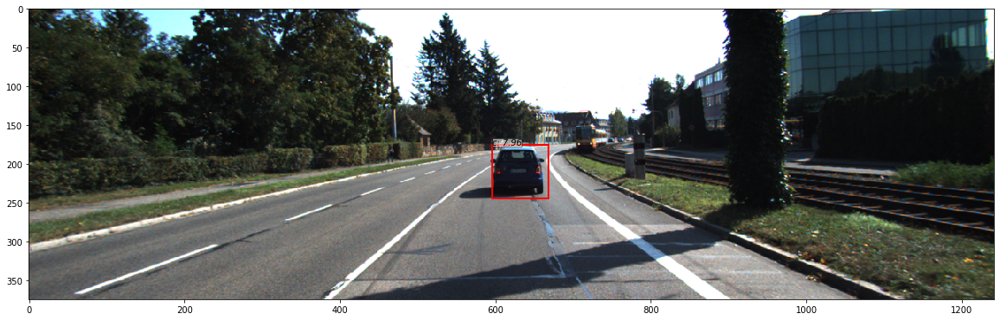

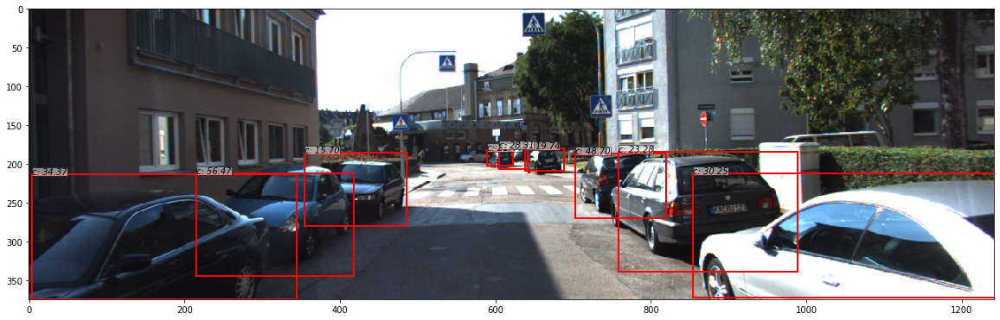

In [19]:
_bboxes, _labels, _scores = trainer.faster_rcnn.predict_mahalanobis(imgs,visualize=True)

vis_bbox(at.tonumpy(imgs[0]),
         at.tonumpy(_bboxes[0]),
         at.tonumpy(_labels[0]).reshape(-1),
         at.tonumpy(_scores[0]).reshape(-1))

vis_bbox(at.tonumpy(imgs[1]),
         at.tonumpy(_bboxes[1]),
         at.tonumpy(_labels[1]).reshape(-1),
         at.tonumpy(_scores[1]).reshape(-1))

# Do some predictions of "weird car" images from Google

/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:638: UserWarning: Legacy autograd function with non-static forward method is deprecated and will be removed in 1.3. Please use new-style autograd function with static forward method. (Example: https://pytorch.org/docs/stable/autograd.html#torch.autograd.Function)
/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:638: UserWarning: Legacy autograd function with non-static forward method is deprecated and will be removed in 1.3. Please use new-style autograd function with static forward method. (Example: https://pytorch.org/docs/stable/autograd.html#torch.autograd.Function)
/opt/conda/conda-bld/pytorch_1565272271120/work/torch/csrc/autograd/python_function.cpp:638: UserWarning: Legacy autograd function with non-static forward method is deprecated and will be removed in 1.3. Please use new-style autograd function with static forward method. (Example: https://pytorch

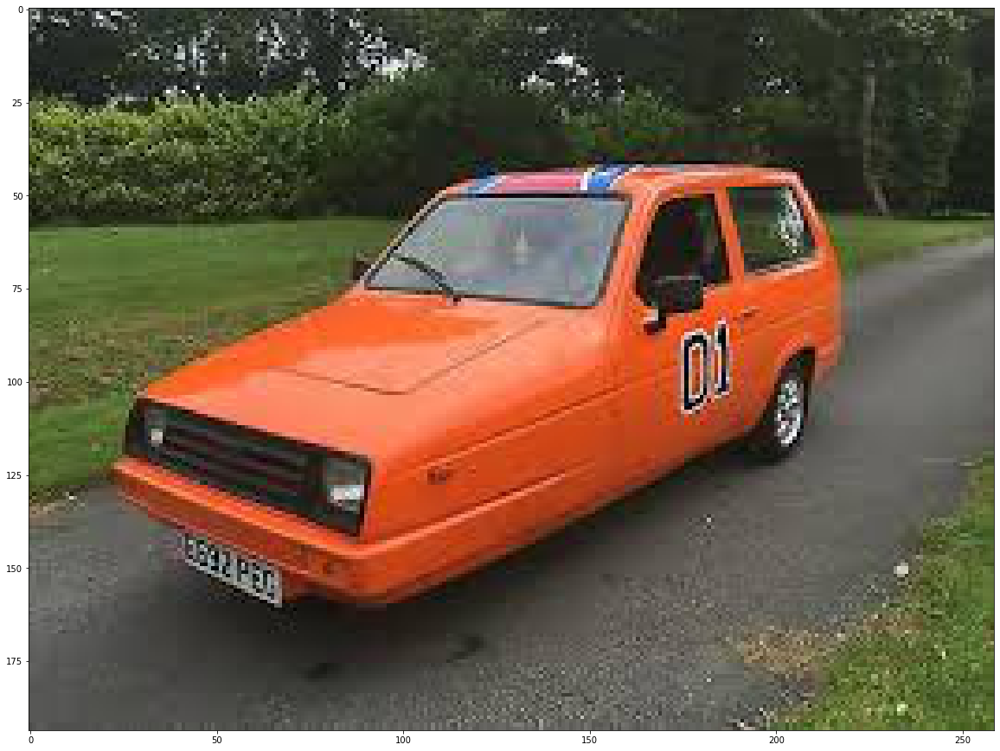

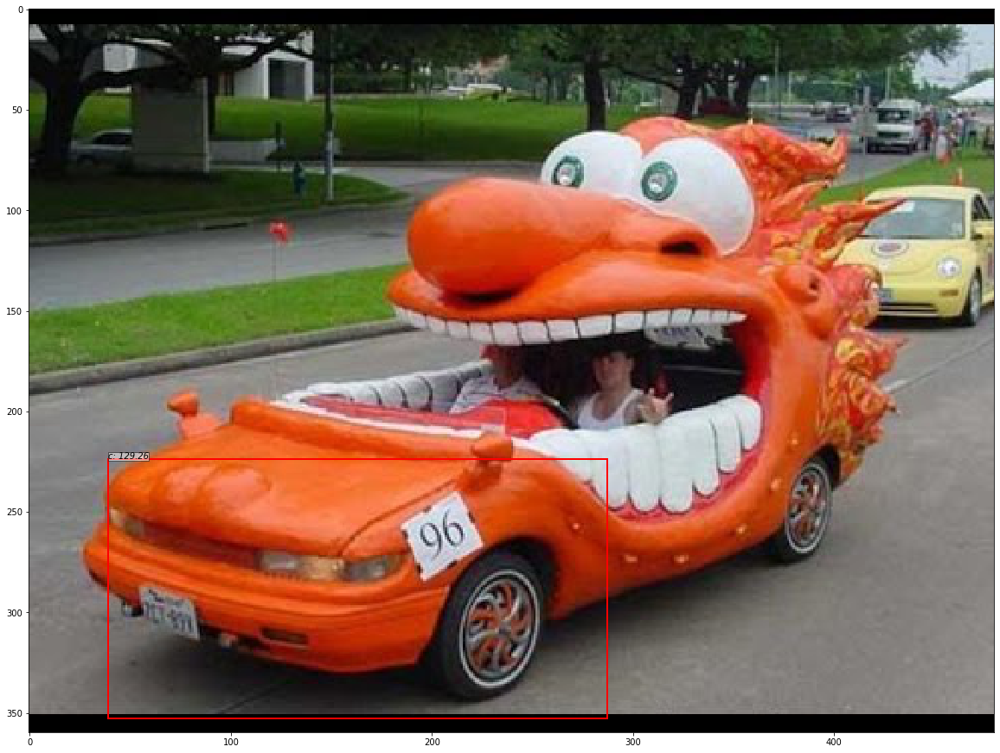

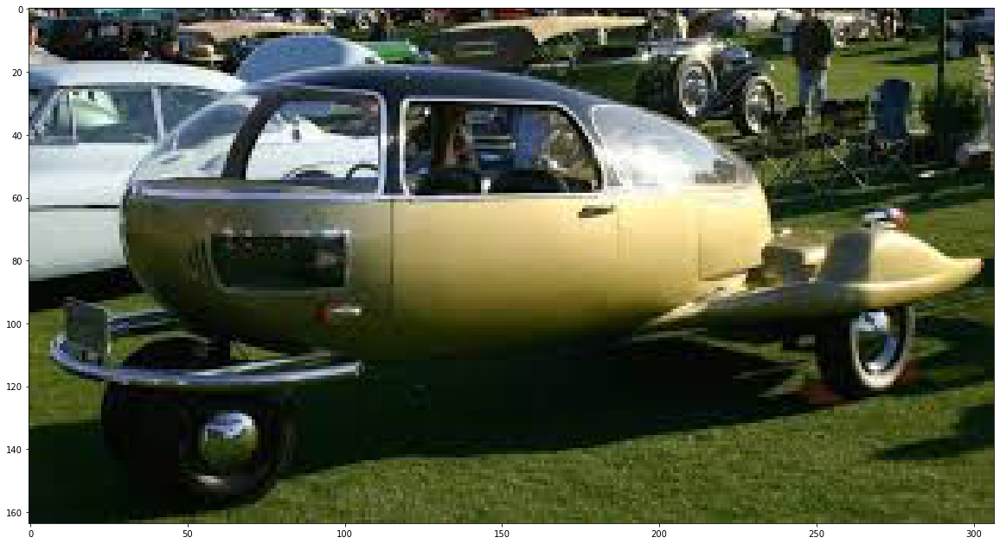

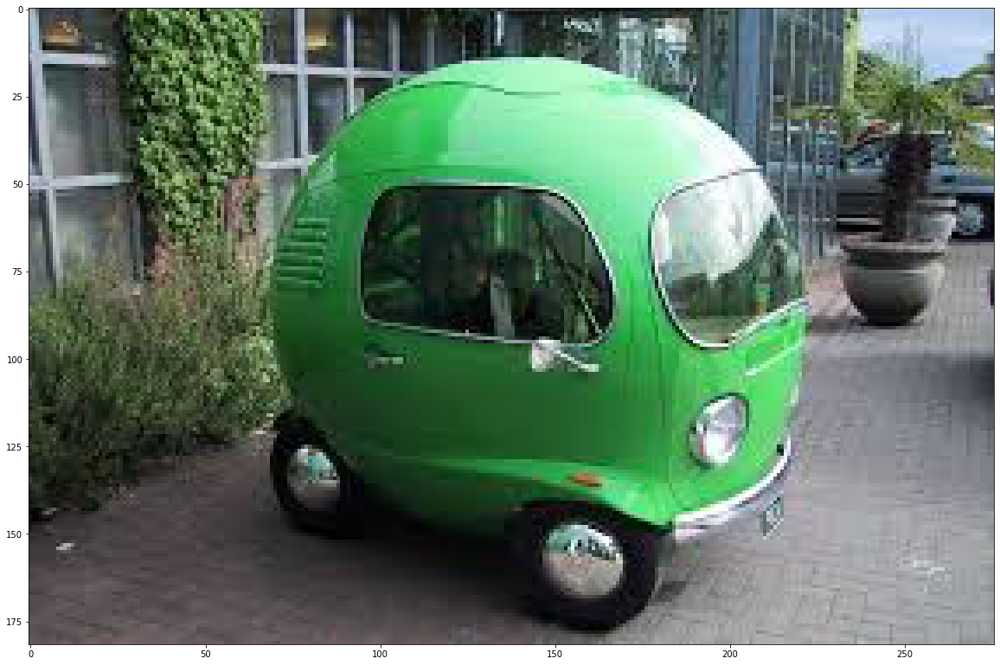

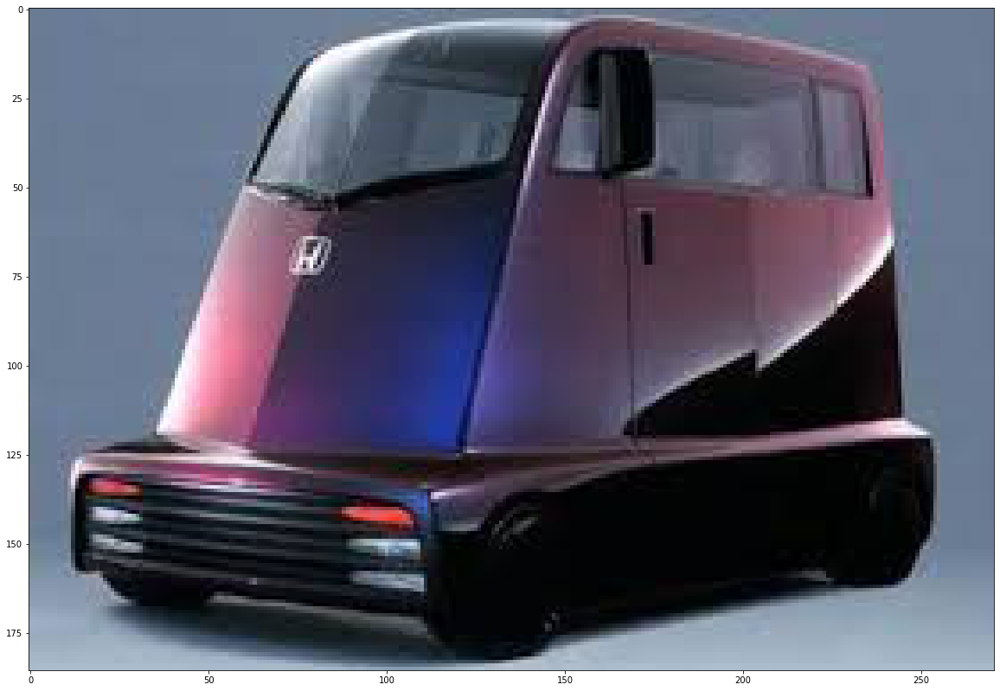

...

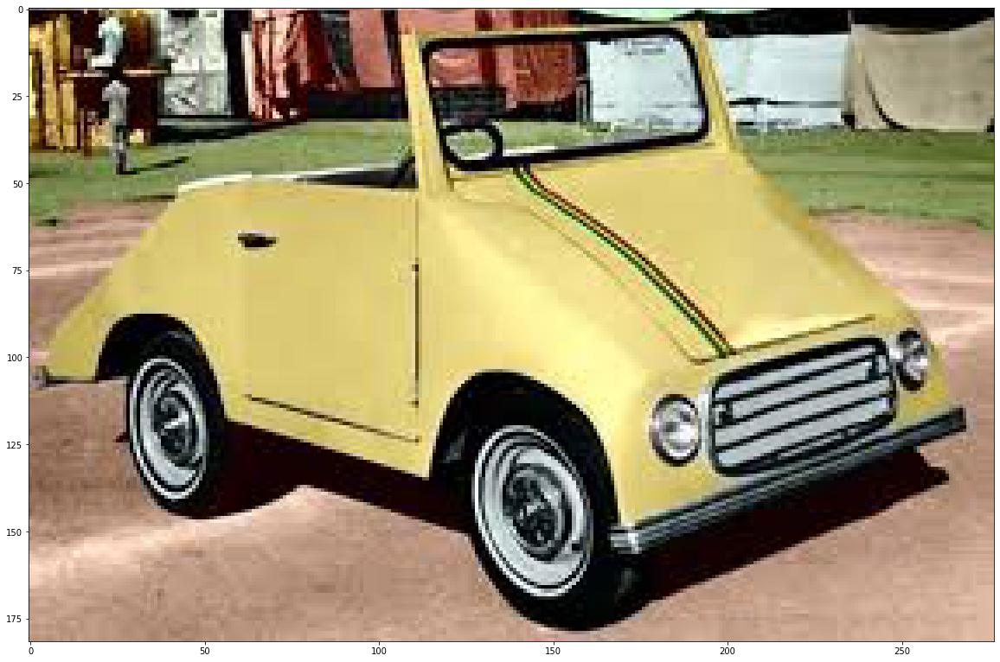

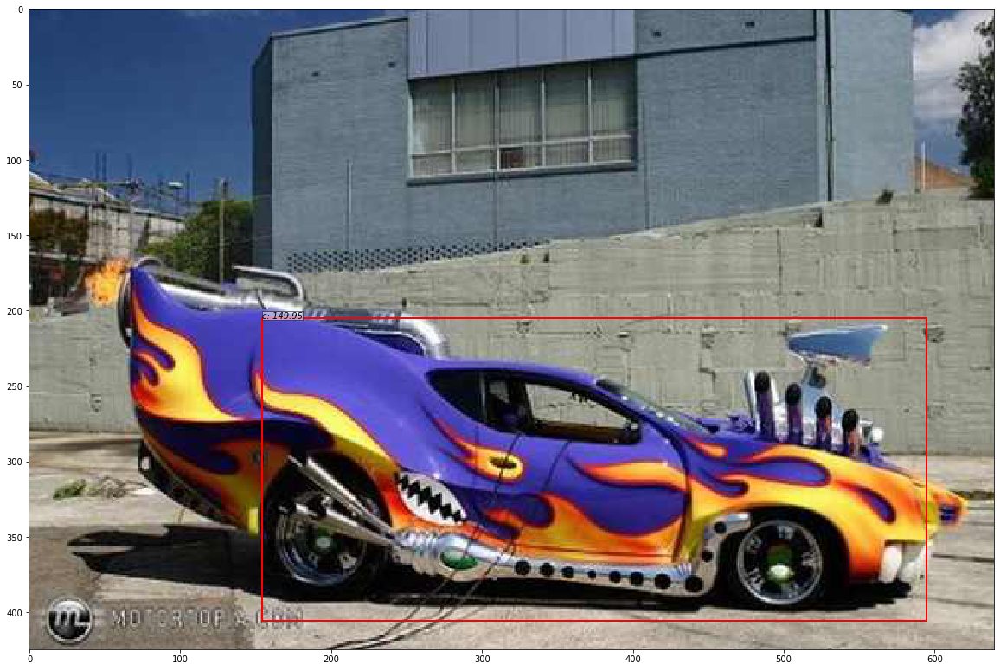

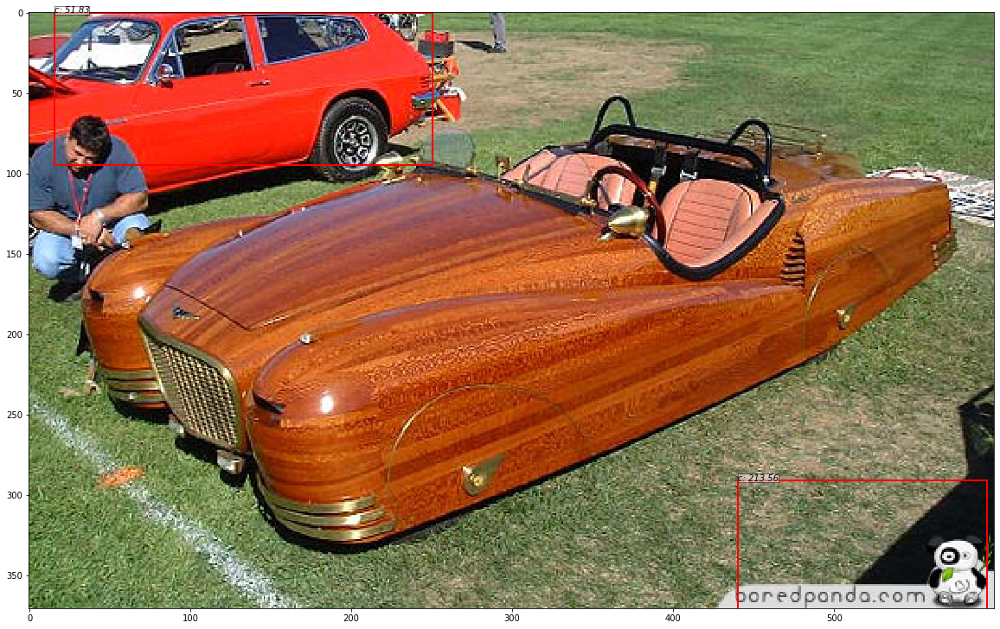

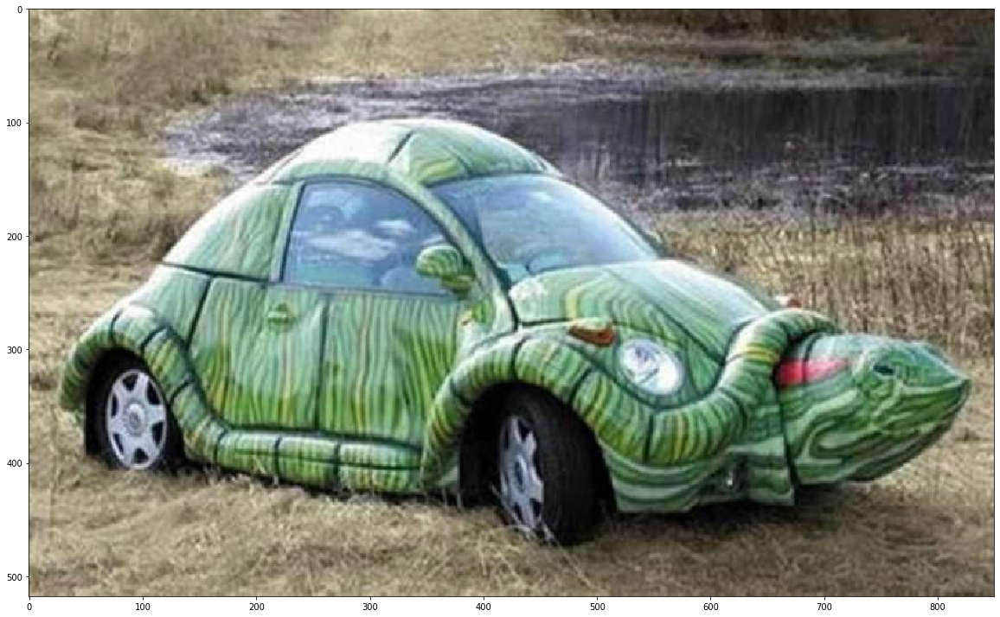

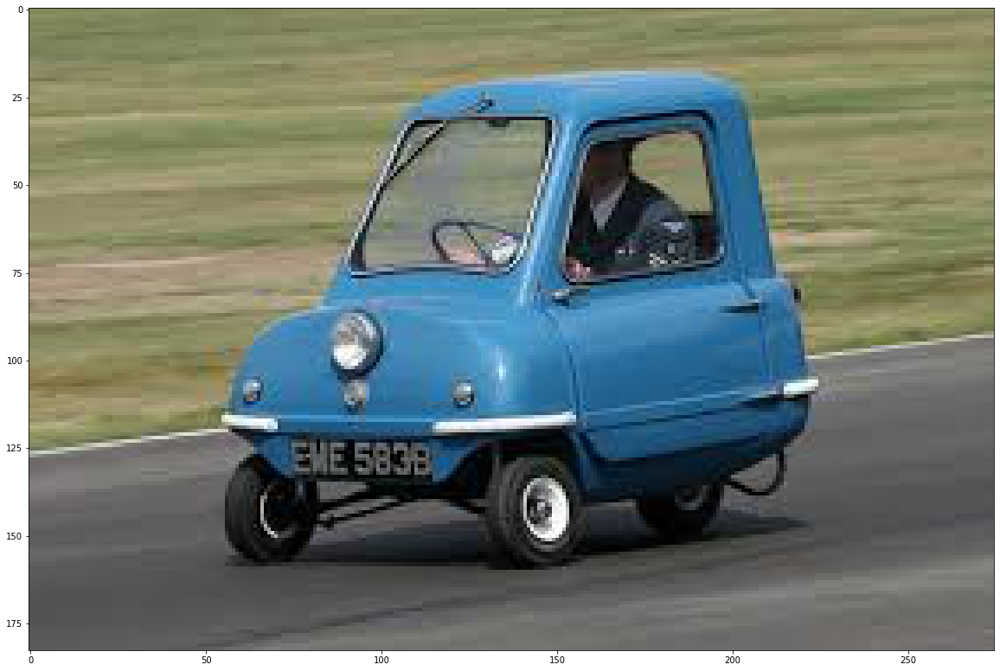

In [20]:
for img_name in os.listdir("./weird_cars"):
    img_path = os.path.join("./weird_cars", img_name)
    im = np.array(read_image(img_path))
    
    _bboxes, _labels, _scores = trainer.faster_rcnn.predict_mahalanobis([im], visualize=True)
    
    vis_bbox(at.tonumpy(im),
         at.tonumpy(_bboxes[0]),
         at.tonumpy(_labels[0]).reshape(-1),
         at.tonumpy(_scores[0]).reshape(-1))

# AUROC Mahalanobis on test data

In [21]:
opt.voc_data_dir = "/media/tadenoud/DATADisk/datasets/kitti_2d/VOC2012/"
dataset = TestDataset(opt)
dataloader = DataLoader(dataset,
                        batch_size=1,
                        shuffle=False,
                        pin_memory=True,
                        num_workers=opt.num_workers)

In [22]:
if TRAIN_MODE:
    features = []
    gt_labels = []

    pred_bboxes, pred_labels, pred_scores = list(), list(), list()
    gt_bboxes, gt_labels, gt_difficults = list(), list(), list()
    for ii, (imgs, sizes, gt_bboxes_, gt_labels_, gt_difficults_) in tqdm(enumerate(dataloader), total=opt.test_num):
        sizes = [sizes[0][0].item(), sizes[1][0].item()]
        pred_bboxes_, pred_labels_, pred_scores_ = faster_rcnn.predict_mahalanobis(imgs, [sizes])
        gt_bboxes += list(gt_bboxes_.numpy())
        gt_labels += list(gt_labels_.numpy())
        gt_difficults += list(gt_difficults_.numpy())
        pred_bboxes += pred_bboxes_
        pred_labels += pred_labels_
        pred_scores += pred_scores_
        
    with open(os.path.join(save_dir, "gt_bboxes_test.pickle"), "wb") as f:
        pickle.dump(gt_bboxes, f)
    with open(os.path.join(save_dir, "gt_labels_test.pickle"), "wb") as f:
        pickle.dump(gt_labels, f)
    with open(os.path.join(save_dir, "gt_difficults_test.pickle"), "wb") as f:
        pickle.dump(gt_difficults, f)

    with open(os.path.join(save_dir, "pred_bboxes_test.pickle"), "wb") as f:
        pickle.dump(pred_bboxes, f)
    with open(os.path.join(save_dir, "pred_labels_test.pickle"), "wb") as f:
        pickle.dump(pred_labels, f)
    with open(os.path.join(save_dir, "pred_scores_test.pickle"), "wb") as f:
        pickle.dump(pred_scores, f)

else:
    with open(os.path.join(save_dir, "gt_bboxes_test.pickle"), "rb") as f:
        gt_bboxes= pickle.load(f)
    with open(os.path.join(save_dir, "gt_labels_test.pickle"), "rb") as f:
        gt_labels = pickle.load(f)
    with open(os.path.join(save_dir, "gt_difficults_test.pickle"), "rb") as f:
        gt_difficults = pickle.load(f)

    with open(os.path.join(save_dir, "pred_bboxes_test.pickle"), "rb") as f:
        pred_bboxes = pickle.load(f)
    with open(os.path.join(save_dir, "pred_labels_test.pickle"), "rb") as f:
        pred_labels = pickle.load(f)
    with open(os.path.join(save_dir, "pred_scores_test.pickle"), "rb") as f:
        pred_scores = pickle.load(f)

In [23]:
IOU_THRESH = 0.5

from model.utils.bbox_tools import bbox_iou

# Ground truth bboxes
print("Ground truth bboxes:", len(np.concatenate(gt_bboxes)))

# Pred bboxes
print("Pred bboxes:", len(np.concatenate(pred_bboxes)))


# Loop through results by image
bboxes_ious = list()
overlapping_bboxes = list()
correct_classification = list()

def iou(bbox, label, gt_boxes, gt_labels, iou_thresh=0.5):
    if not len(gt_labels):
        return 0, False
    try:
        ious = bbox_iou(np.array([bbox]), gt_boxes)
        best_iou = np.max(ious)
        best_label = gt_labels[np.argmax(ious)]
        
    except ValueError:
        import pdb; pdb.set_trace()
    return best_iou, best_iou > 0 and best_label == label
            

for gt_bbox, gt_label, pred_bbox, pred_label, pred_score in \
        zip(gt_bboxes, gt_labels, pred_bboxes, pred_labels, pred_scores):
    # Calculate if the pred bbox has an overlapping gt_bbox
    bboxes_ious.append([])
    overlapping_bboxes.append([])
    correct_classification.append([])
    for bbox, label, score in zip(pred_bbox, pred_label, pred_score):
        bbox_iou_score, correct_class = iou(bbox, label, gt_bbox, gt_label)
            
        bboxes_ious[-1].append(bbox_iou_score)
        overlapping_bboxes[-1].append(bbox_iou_score > IOU_THRESH)
        correct_classification[-1].append(correct_class)

Ground truth bboxes: 20281
Pred bboxes: 29035


In [24]:
from itertools import chain
from metrics import barcode_plot, fpr_at_95_tpr, auroc, detection_error

scores = list(chain(*pred_scores))
overlap_correct = list(chain(*overlapping_bboxes))
class_correct = list(chain(*correct_classification))
both_correct = [a and b for a, b in zip(overlap_correct, class_correct)]

print("AUROC")
print("Overlap", auroc(scores, overlap_correct))
print("Class", auroc(scores, class_correct))
print("Both", auroc(scores, both_correct))
print()
print("FPR@95TPR")
print("Overlap", fpr_at_95_tpr(scores, overlap_correct))
print("Class", fpr_at_95_tpr(scores, class_correct))
print("Both", fpr_at_95_tpr(scores, both_correct))
print()
print("Detection Err")
print("Overlap", detection_error(scores, overlap_correct))
print("Class", detection_error(scores, class_correct))
print("Both", detection_error(scores, both_correct))

AUROC
Overlap 0.09730847955752692
Class 0.26945206332504706
Both 0.09046422536323924

FPR@95TPR
Overlap 0.999350879263543
Class 0.9982620785540494
Both 0.9993672706356054

Detection Err
Overlap 0.5
Class 0.5
Both 0.5


/home/tadenoud/Git/simple-faster-rcnn-pytorch/metrics.py:250: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


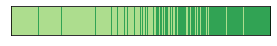

In [25]:
from metrics import barcode_plot, fpr_at_95_tpr, auroc
barcode_plot([-a for a in scores], both_correct)

/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  """


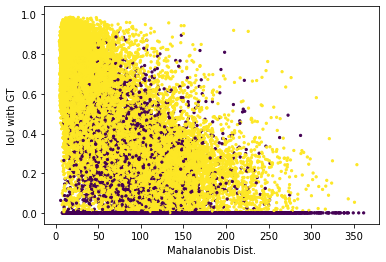

In [26]:
# Mahalanobis score vs IoU vs correct classificationplt.figure()
plt.scatter(scores, list(chain(*bboxes_ious)), c=class_correct, cmap='viridis', s=5)
plt.xlabel("Mahalanobis Dist.")
plt.ylabel("IoU with GT")
plt.show()

# AUROC Max Softmax on test data

In [27]:
opt.voc_data_dir = "/media/tadenoud/DATADisk/datasets/kitti_2d/VOC2012/"
dataset = TestDataset(opt)
dataloader = DataLoader(dataset,
                        batch_size=1,
                        shuffle=False,
                        pin_memory=True,
                        num_workers=opt.num_workers)

In [28]:
if TRAIN_MODE:
    features = []
    gt_labels = []

    pred_bboxes, pred_labels, pred_scores = list(), list(), list()
    for ii, (imgs, sizes, gt_bboxes_, gt_labels_, gt_difficults_) in tqdm(enumerate(dataloader), total=opt.test_num):
        sizes = [sizes[0][0].item(), sizes[1][0].item()]
        pred_bboxes_, pred_labels_, pred_scores_ = faster_rcnn.predict(imgs, [sizes])
        pred_bboxes += pred_bboxes_
        pred_labels += pred_labels_
        pred_scores += pred_scores_

    with open(os.path.join(save_dir, "pred_bboxes_test_softmax.pickle"), "wb") as f:
        pickle.dump(pred_bboxes, f)
    with open(os.path.join(save_dir, "pred_labels_test_softmax.pickle"), "wb") as f:
        pickle.dump(pred_labels, f)
    with open(os.path.join(save_dir, "pred_scores_test_softmax.pickle"), "wb") as f:
        pickle.dump(pred_scores, f)

else:
    with open(os.path.join(save_dir, "pred_bboxes_test_softmax.pickle"), "rb") as f:
        pred_bboxes = pickle.load(f)
    with open(os.path.join(save_dir, "pred_labels_test_softmax.pickle"), "rb") as f:
        pred_labels = pickle.load(f)
    with open(os.path.join(save_dir, "pred_scores_test_softmax.pickle"), "rb") as f:
        pred_scores = pickle.load(f)
        
with open(os.path.join(save_dir, "gt_bboxes_test.pickle"), "rb") as f:
    gt_bboxes = pickle.load(f)
with open(os.path.join(save_dir, "gt_labels_test.pickle"), "rb") as f:
    gt_labels = pickle.load(f)
with open(os.path.join(save_dir, "gt_difficults_test.pickle"), "rb") as f:
    gt_difficults = pickle.load(f)

In [29]:
from model.utils.bbox_tools import bbox_iou

# Ground truth bboxes
print("Ground truth bboxes:", len(np.concatenate(gt_bboxes)))

# Pred bboxes
print("Pred bboxes:", len(np.concatenate(pred_bboxes)))

# Loop through results by image
bboxes_ious = list()
overlapping_bboxes = list()
correct_classification = list()

for gt_bbox, gt_label, pred_bbox, pred_label, pred_score in \
        zip(gt_bboxes, gt_labels, pred_bboxes, pred_labels, pred_scores):
    # Calculate if the pred bbox has an overlapping gt_bbox
    bboxes_ious.append([])
    overlapping_bboxes.append([])
    correct_classification.append([])
    for bbox, label, score in zip(pred_bbox, pred_label, pred_score):
        bbox_iou_score, correct_class = iou(bbox, label, gt_bbox, gt_label)
        
        bboxes_ious[-1].append(bbox_iou_score)
        overlapping_bboxes[-1].append(bbox_iou_score > IOU_THRESH)
        correct_classification[-1].append(correct_class)

Ground truth bboxes: 20281
Pred bboxes: 20642


In [30]:
from itertools import chain
from sklearn.metrics import roc_auc_score

scores = list(chain(*pred_scores))
overlap_correct = list(chain(*overlapping_bboxes))
class_correct = list(chain(*correct_classification))
both_correct = [a and b for a, b in zip(overlap_correct, class_correct)]

print("AUROC")
print("Overlap", auroc(scores, overlap_correct))
print("Class", auroc(scores, class_correct))
print("Both", auroc(scores, both_correct))
print()
print("FPR@95TPR")
print("Overlap", fpr_at_95_tpr(scores, overlap_correct))
print("Class", fpr_at_95_tpr(scores, class_correct))
print("Both", fpr_at_95_tpr(scores, both_correct))
print()
print("Detection Err")
print("Overlap", detection_error(scores, overlap_correct))
print("Class", detection_error(scores, class_correct))
print("Both", detection_error(scores, both_correct))

AUROC
Overlap 0.9189446078987685
Class 0.7885422966127595
Both 0.9294091436700178

FPR@95TPR
Overlap 0.4137038703870387
Class 0.8587904360056259
Both 0.34178444276620995

Detection Err
Overlap 0.23182215809636092
Class 0.45438497629859337
Both 0.1958196811562519


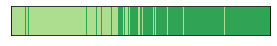

In [31]:
from metrics import barcode_plot
barcode_plot(scores, both_correct)

/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  


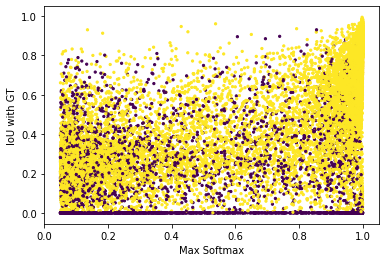

In [32]:
# Softmax score vs IoU vs correct classification
plt.figure()
plt.scatter(scores, list(chain(*bboxes_ious)), c=class_correct, cmap='viridis', s=5)
plt.xlabel("Max Softmax")
plt.ylabel("IoU with GT")
plt.show()

In [33]:
with open(os.path.join(save_dir, "pred_scores_test_softmax.pickle"), "rb") as f:
    softmax_scores = pickle.load(f)
    softmax_scores = list(chain(*softmax_scores))
        
with open(os.path.join(save_dir, "pred_scores_test.pickle"), "rb") as f:
    mahal_scores = pickle.load(f)
    mahal_scores = list(chain(*mahal_scores))

ValueError: x and y must be the same size

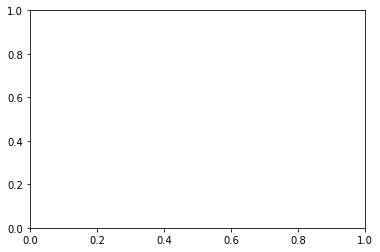

In [34]:
# Mahalanobis score vs Softmax score vs IoU
plt.figure()
plt.scatter(softmax_scores, mahal_scores, c=list(chain(*bboxes_ious)), cmap='viridis', s=5)
plt.xlabel("Mahalanobis Dist.")
plt.ylabel("Max Softmax")
leg = plt.colorbar()
leg.set_label("IoU with GT")
plt.show()